In [1]:
!pip install h5py
!pip install matplotlib==3.4.0
!pip install e2cnn
!pip install pytorch_lightning

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.3/10.3 MB 28.6 MB/s eta 0:00:00
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.2.2
    Uninstalling matplotlib-3.2.2:
      Successfully uninstalled matplotlib-3.2.2


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 225.1/225.1 KB 11.8 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 800.3/800.3 KB 26.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 125.4/125.4 KB 16.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 512.4/512.4 KB 50.2 MB/s eta 0:00:00


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [1]:
import torch
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
torch.manual_seed(42)

In [2]:
import h5py
import pandas as pd
import os
import seaborn as sns
import matplotlib.pyplot as plt
from PIL import Image
import matplotlib.pyplot as plt
import random
from e2cnn import gspaces
from e2cnn import nn
from torchsummary import summary
from pytorch_lightning import LightningModule
from torch.nn import functional as F
from typing import Optional
import numpy as np
from torch.utils.data import DataLoader, TensorDataset
from pytorch_lightning import Trainer
from pytorch_lightning.loggers import TensorBoardLogger
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
from typing import Tuple
from tqdm.auto import tqdm

In [3]:
import matplotlib
print(matplotlib.__version__)

3.4.0


## Wczytanie danych

In [4]:
filename_train_x='/content/drive/MyDrive/Dane_projekt_UR/camelyonpatch_level_2_split_train_x.h5'
filename_train_y='/content/drive/MyDrive/Dane_projekt_UR/camelyonpatch_level_2_split_train_y.h5'
filename_test_x='/content/drive/MyDrive/Dane_projekt_UR/camelyonpatch_level_2_split_test_x.h5'
filename_test_y='/content/drive/MyDrive/Dane_projekt_UR/camelyonpatch_level_2_split_test_y.h5'

train_x = {}
train_y = {}
test_x = {}
test_y = {}

import torchvision

transform = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor()
])

with h5py.File(filename_train_y, "r") as f:
    for key in f.keys():
        ds_arr = f[key][()] 
        ds_arr.shape = (ds_arr.shape[0])
        train_y[key] = ds_arr[:1000] 


with h5py.File(filename_train_x, "r") as f:
    for key in f.keys():
        ds_arr = f[key][()] 
        train_x[key] = ds_arr[:1000] 

train_data = []
for i in range(0, 1000):
   train_data.append([transform(train_x['x'][i]), train_y['y'][i]])
   

with h5py.File(filename_test_y, "r") as f:
    for key in f.keys():
        ds_arr = f[key][()]  
        ds_arr.shape = (ds_arr.shape[0])
        test_y[key] = ds_arr[:1000]

with h5py.File(filename_test_x, "r") as f:
    for key in f.keys():
        ds_arr = f[key][()] 
        test_x[key] = ds_arr[:1000]

test_data = []
for i in range(0, 1000):
   test_data.append([transform(test_x['x'][i]), test_y['y'][i]])

## EDA


Pełen zbiór:


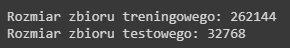

Zbiór PCAM składa się z zbioru treningowego, walidacyjnego i testowego. Na potrzeby projektu wykorzystano jedynie zbiór treningowy i testowy. Z powodu dużego rozmiaru wymienionych zbiorów i ograniczeń sprzętowych zdecydowano o wykorzystaniu 1000 obrazów z zbioru treningowego i 1000 obrazów z zbioru testowego. Każdy z obrazów był kolorowy (RGB) oraz miał wymiar 96x96 pikseli. 
Zdjęcia zostały poddane normalizacji. Wykorzystano w tym celu bibliotekę ``torchvision``.

```
transform = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor()
])
```



In [ ]:
train_size = len(train_x['x'])
test_size = len(test_x['x'])

print("Rozmiar zbioru treningowego: {}".format(train_size))
print("Rozmiar zbioru testowego: {}".format(test_size))

Rozmiar zbioru treningowego: 1000
Rozmiar zbioru testowego: 1000


Text(0.5, 0.98, 'Rozkład klas w zbiorze treningowym')

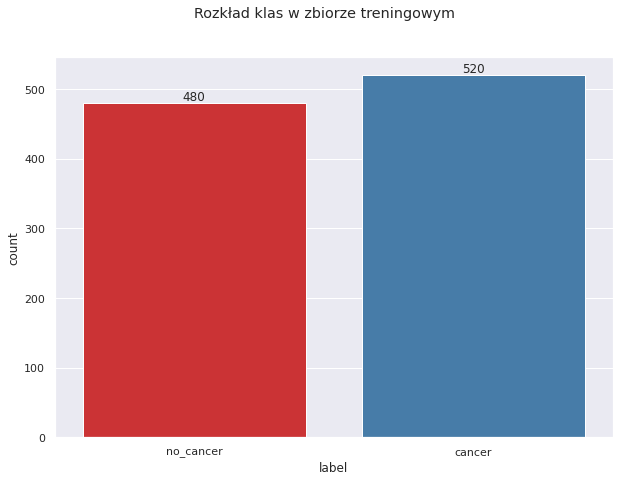

In [ ]:
df = pd.DataFrame.from_dict(train_y)
class_count = df.value_counts()
sns.set(rc={'figure.figsize':(10,7)})
d = {'label': ['no_cancer', 'cancer'], 'count': [class_count[0], class_count[1]]}
pd_for_barplot = pd.DataFrame(data=d)
ax = sns.barplot(data=pd_for_barplot, x="label", y="count", palette=sns.color_palette("Set1"))
ax.bar_label(ax.containers[0])
ax.figure.suptitle('Rozkład klas w zbiorze treningowym')

W zbiorze treningowym znajdowało się 480 obrazów należących do klasy *no cancer (0)* i 520 obrazów należących do klasy *cancer (1)*. W związku z czym można wysnuć wniosek, że zbiór treningowy jest zbalansowany.

Text(0.5, 0.98, 'Rozkład klas w zbiorze testowym')

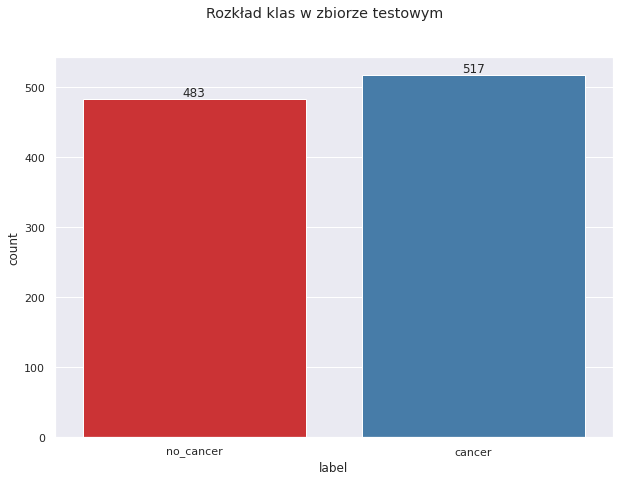

In [ ]:
df = pd.DataFrame.from_dict(test_y)
class_count = df.value_counts()
sns.set(rc={'figure.figsize':(10,7)})
d = {'label': ['no_cancer', 'cancer'], 'count': [class_count[0], class_count[1]]}
pd_for_barplot = pd.DataFrame(data=d)
ax = sns.barplot(data=pd_for_barplot, x="label", y="count", palette=sns.color_palette("Set1"))
ax.bar_label(ax.containers[0])
ax.figure.suptitle('Rozkład klas w zbiorze testowym')

W zbiorze testowym znajdowały się 483 obrazy należące do klasy *no cancer (0)*. Oprócz tego było 517 obrazów należących do klasy *cancer (1)*. W związku z czym można wysnuć wniosek, że zbiór testowy jest zbalansowany.

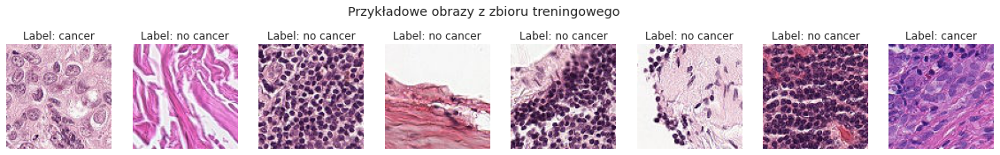

In [ ]:
fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8) = plt.subplots(1, 8)
fig.set_figwidth(20)
fig.set_figheight(3)
fig.suptitle('Przykładowe obrazy z zbioru treningowego')
img_number = [random.randint(0,train_size) for _ in range(8)]
axs = [ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8]
for ax, number in zip(axs, img_number):
  ax.imshow(train_x['x'][number])
  if train_y['y'][number] == 0:
    lab ='no cancer'
  else: 
    lab = 'cancer'
  ax.set_title('Label: %s'%lab)
  ax.axis("off")

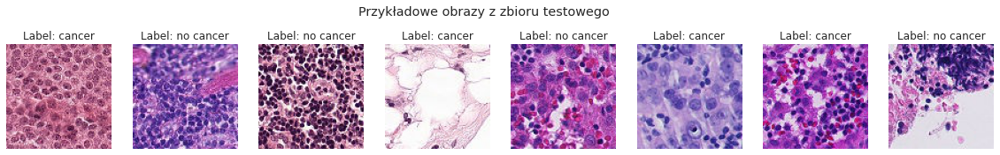

In [ ]:
fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8) = plt.subplots(1, 8)
fig.set_figwidth(20)
fig.set_figheight(3)
fig.suptitle('Przykładowe obrazy z zbioru testowego')
img_number = [random.randint(0,test_size) for _ in range(8)]
axs = [ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8]
for ax, number in zip(axs, img_number):
  ax.imshow(test_x['x'][number])
  if test_y['y'][number] == 0:
    lab ='no cancer'
  else: 
    lab = 'cancer'
  ax.set_title('Label: %s'%lab)
  ax.axis("off")

In [5]:
del train_x
del train_y
del test_x
del test_y

# Przeprowadzone badania

**Opis problemu:**

Celem projektu jest sprawdzenie czy zastosowanie ekwiwariantnych sieci konwolucyjnych na zbiorze PCAM pozwala na osiągnięcie lepszych rezultatów niż sieć konwolucyjna. W tym celu stworzono dwa autokodery. Pierwszy składa się z kodera wykorzystującego ekwiwariantne sieci konwolucyjne oraz dekodera. Drugi natomiast wykorzystuje koder oparty na warstwach konwolucyjnych oraz dekoder. Typ problemu do jakiego ma być zastosowana reprezentacja to klasyfikacja. W tym notebooku zostały przeprowadzone badania sprawdzające jakość uzyskanych reprezentacji. Natomiast w drugim notebooku (*Projekt_UR_Klasyfikacja.ipynb*) do stworzonych koderów dodano sieć MLP w celu zbadania dokładności klasyfikacji. Dane wyjściowe klasyfikacji to etykiety:


*   0 - oznacza brak zmian nowotworowych (*no cancer*)
*   1 - oznacza występowanie zmian nowotworowych (*cancer*)

**Hipoteza badawcza:** 

Zastosowanie ekwiwariantnych sieci konwolucyjnych jako kodera pozwoli na uzyskanie lepszych wyników niż zastosowanie zwykłej sieci konwolucyjnej w roli kodera. 

**Opis modelu:**


W projekcie wykorzystano dwa autokodery. W obu zastosowano taki sam dekoder. Jako pierwszy koder użyto koder oparty o ekwiwariantne sieci konwolucyjne. Koncepcja tych sieci została opisana przez Cohena i Wellinga w 2016 roku w publikacji "*Group Equivariant Convolutional Networks*" (https://arxiv.org/pdf/1602.07576.pdf). Ekwiwariantne sieci konwolucyjne zostały też wykorzystane do klasyfikacji na zbiorze PCAM w publikcaji "*Rotation Equivariant CNNs for Digital Pathology*" (https://paperswithcode.com/paper/rotation-equivariant-cnns-for-digital).Drugi autoenkoder składał się z sieci konwolucyjnych. Do zbadania dokładności klasyfikacji wykorzystano wymienione powyżej kodery oraz sieć MLP. 

Model autokodera działa w następujący sposób: koder tworzy reprezentację, którą następnie dekoder dekoduje. W związku z tym przeprowadzono badania jakości uzyskiwanej reprezentacji oraz zbadano jak wpływa ona na dokładność klasyfikacji. 


---



Model kodera wykorzystującego ekwiwariantne sieci konwolucyjne ma następującą architekturę:

* pierwsza warstwa konwolucji obrotowej R2Conv obliczająca 8 filtrów wyjściowych
* aktywacja ReLU
* druga warstwa konwolucji obrotowej R2Conv obliczająca 16 filtrów wyjściowych
* aktywacja ReLU
* trzecia warstwa konwolucji obrotowej R2Conv obliczająca 32 filtry wyjściowe
* aktywacja ReLU
* czwarta warstwa konwolucji obrotowej R2Conv obliczająca 64 filtrów wyjściowych
* aktywacja ReLU
* piąta warstwa konwolucji obrotowej R2Conv obliczająca 96 filtrów wyjściowych
* redukacja maksymalizująca (PointwiseMaxPoolAntialiased) z kernelem o wymiarze 3
* redukcja grupowa (GroupPooling)
* wielowarstwowy perceptron (spłaszczenie macierzy do wektora,
warstwa liniowa z 128 cechami wyjściowymi,
aktywacja ReLU.
warstwa liniowa z latent_dim cechami wyjściowymi)

Każda warstwa konwolucji ma parametry kernel_size=3, stride=2, padding=1.

---

Model kodera wykorzystującego sieci konwolucyjne ma następującą architekturę:

* pierwsza warstwa konwolucji obliczająca 8 filtrów wyjściowych
* aktywacja ReLU
* druga warstwa konwolucji obliczająca 16 filtrów wyjściowych
* aktywacja ReLU
* trzecia warstwa konwolucji obliczająca 32 filtry wyjściowe
* aktywacja ReLU
* czwarta warstwa konwolucji obliczająca 64 filtrów wyjściowych
* aktywacja ReLU
* piąta warstwa konwolucji obliczająca 96 filtrów wyjściowych
* redukacja (MaxPool2d) z kernelem o wymiarze 3
* wielowarstwowy perceptron (spłaszczenie macierzy do wektora,
warstwa liniowa z 128 cechami wyjściowymi,
aktywacja ReLU.
warstwa liniowa z latent_dim cechami wyjściowymi)

Każda warstwa konwolucji ma parametry kernel_size=3, stride=2, padding=1.




**Metryki:**

Do oceny jakości klasyfikacji wykorzystano dokładność (Accuracy). Natomiast do oceny jakości reprezentacji miarę AUC (ROC AUC Score). 

## Autokoder z koderem wykorzystującym ekwiwariantne sieci konwolucyjne

In [6]:
class GCNNEncoder(torch.nn.Module):
    
    def __init__(self, latent_dim: int, N: int):
        super(GCNNEncoder, self).__init__()

        self.r2_act = gspaces.Rot2dOnR2(N=N)
        in_type = nn.FieldType(self.r2_act, 3*[self.r2_act.trivial_repr])
        self.in_typ = in_type
        
        # convolution 1
        out_type = nn.FieldType(self.r2_act, 8*[self.r2_act.regular_repr])
        self.block1 = nn.SequentialModule(
            nn.R2Conv(in_type, out_type, kernel_size=3, stride=2, padding=1),
            nn.ReLU(out_type)
        )
        # convolution 2
        in_type = self.block1.out_type
        out_type = nn.FieldType(self.r2_act, 16*[self.r2_act.regular_repr])
        self.block2 = nn.SequentialModule(
            nn.R2Conv(in_type, out_type, kernel_size=3, stride=2, padding=1),
            nn.ReLU(out_type)
        )
       # convolution 3
        in_type = self.block2.out_type
        out_type = nn.FieldType(self.r2_act, 32*[self.r2_act.regular_repr])
        self.block3 = nn.SequentialModule(
            nn.R2Conv(in_type, out_type, kernel_size=3, stride=2, padding=1),
            nn.ReLU(out_type)
        )
        # convolution 4
        in_type = self.block3.out_type
        out_type = nn.FieldType(self.r2_act, 64*[self.r2_act.regular_repr])
        self.block4 = nn.SequentialModule(
            nn.R2Conv(in_type, out_type, kernel_size=3, stride=2, padding=1),
            nn.ReLU(out_type)
        )
        # convolution 5
        in_type = self.block4.out_type
        out_type = nn.FieldType(self.r2_act, 96*[self.r2_act.regular_repr])
        self.block5 = nn.SequentialModule(
            nn.R2Conv(in_type, out_type, kernel_size=3, stride=2, padding=1),
            nn.ReLU(out_type)
        )

        self.pool = nn.PointwiseMaxPoolAntialiased(out_type, kernel_size=3)
        self.gpool = nn.GroupPooling(out_type)
        c = self.gpool.out_type.size
        self.fully_net = torch.nn.Sequential(
          torch.nn.Flatten(),
          torch.nn.Linear(c, 128),
          torch.nn.ReLU(True),
          torch.nn.Linear(128, latent_dim),
        )
        
    def forward(self, img: torch.Tensor) -> torch.Tensor:
        x = nn.GeometricTensor(img, self.in_typ)
        x = self.block1(x)
        x = self.block2(x)
        x = self.block3(x)
        x = self.block4(x)
        x = self.block5(x)
        x = self.pool(x)
        x = self.gpool(x)
        x = x.tensor
        x = self.fully_net(x.reshape(x.shape[0], -1))
        return x

In [7]:
class Autoencoder(LightningModule):

    def __init__(self, encoder: torch.nn.Module, decoder: torch.nn.Module):
        super().__init__()

        self._encoder = encoder
        self._decoder = decoder

    def forward(self, x):
        return self._encoder(x)

    def reconstruct(self, x):
        return self._decoder(z=self(x))

    def training_step(self, batch, batch_size):
        x, _ = batch
        xr = self.reconstruct(x)

        loss = F.mse_loss(input=xr, target=x)
        self.log("train/mse", loss.detach().item())
        return loss
        
    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=1e-3)


In [8]:
class CNNDecoder(torch.nn.Module):

    def __init__(self, latent_dim: int):
        super().__init__()

        self._layers = torch.nn.Sequential(
            # MLP
            torch.nn.Linear(latent_dim, 128),
            torch.nn.ReLU(True),
            torch.nn.Linear(128, 96 * 3 * 3),
            torch.nn.ReLU(True),
            # Reshape into image
            torch.nn.Unflatten(dim=1, unflattened_size=(96, 3, 3)),
            # Deconvolution
            torch.nn.ConvTranspose2d(96, 64, 3, stride=2, padding=1, output_padding=1),
            torch.nn.ReLU(True),
            torch.nn.ConvTranspose2d(64, 32, 3, stride=2, padding=1, output_padding=1),
            torch.nn.ReLU(True),
            torch.nn.ConvTranspose2d(32, 16, 3, stride=2, padding=1, output_padding=1),
            torch.nn.ReLU(True),
            torch.nn.ConvTranspose2d(16, 8, 3, stride=2, padding=1, output_padding=1),
            torch.nn.ReLU(True),
            torch.nn.ConvTranspose2d(8, 3, 3, stride=2, padding=1, output_padding=1)
        )

    def forward(self, z):
        return self._layers(z)


In [9]:
class GCNNAutoencoder(Autoencoder):
    
    def __init__(self, latent_dim: int):
        super().__init__(
            encoder=GCNNEncoder(latent_dim=latent_dim, N=8),
            decoder=CNNDecoder(latent_dim=latent_dim),
        )
    

In [10]:
def extract_representations(
    model: Autoencoder,
    train_dl: DataLoader,
    test_dl: DataLoader
) -> dict:
    output = {
        "train": {"z": [], "y": []},
        "test": {"z": [], "y": []},
    }

    for split, loader in (
        ("train", train_dl),
        ("test", test_dl),
    ):
        for x, y in tqdm(loader):
            with torch.no_grad():
                output[split]["z"].append(model(x))
                output[split]["y"].append(y)

        output[split]["z"] = torch.cat(output[split]["z"], dim=0)
        output[split]["y"] = torch.cat(output[split]["y"], dim=0)

    return output

def evaluate_linear(
    z_train: torch.Tensor,
    y_train: torch.Tensor,
    z_test: torch.Tensor,
    y_test: torch.Tensor
) -> Tuple[float, float]:
    lr = LogisticRegression(max_iter=500)
    lr.fit(z_train, y_train)

    auc_train = roc_auc_score(
        y_true=y_train,
        y_score=lr.predict_proba(z_train)[:,1]
    )
    auc_test = roc_auc_score(
        y_true=y_test,
        y_score=lr.predict_proba(z_test)[:,1]
    )

    return auc_train, auc_test

In [11]:
def visualize_latent_spaces(representations: dict):
    fig, axs = plt.subplots(ncols=2, figsize=(10, 5), sharex=True, sharey=True)

    for split, ax in zip(("train", "test"), axs.ravel()):
        z = representations[split]["z"]
        label = representations[split]["y"]
        sns.scatterplot(
            x=z[:, 0],
            y=z[:, 1],
            hue=label,
            ax=ax,
            legend="full",
            palette="Set1"
        )
        ax.set(title=split.title())

In [12]:
def visualize_random_sample(
    model: Autoencoder,
    dataset,
    num_samples: int = 6,
    seed: int = 42,
    max_index = 0
):
    np.random.seed(seed)
    if max_index != 0 :
      indices = np.random.choice(range(max_index), size=num_samples)    
    else:
      indices = np.random.choice(range(len(dataset)), size=num_samples)
    fig, axs = plt.subplots(nrows=2, ncols=num_samples, figsize=(15, 5))

    for i, sample_idx in enumerate(indices):
        org_img, label = dataset[sample_idx]
        if label == 0:
          label = 'no cancer'
        else:
          label = 'cancer'
        axs[0, i].imshow(org_img[0], cmap="gray")
        axs[0, i].set(title=f"Label: {label}", xticks=[], yticks=[])

        with torch.no_grad():
            rec_img = model.reconstruct(org_img.unsqueeze(dim=0))
        axs[1, i].imshow(rec_img[0][0], cmap="gray")
        axs[1, i].set(xticks=[], yticks=[])

        if i == 0:
            axs[0, i].set(ylabel="Original")
            axs[1, i].set(ylabel="Reconstruction")

In [13]:
LOG_PATH = "./data/"

In [ ]:
%load_ext tensorboard
%tensorboard --logdir $LOG_PATH --host 0.0.0.0 --port 6006

<IPython.core.display.Javascript object>

### Badanie dla podzbioru danych

Wzięto 10 obrazów jako podzbiór danych. Następnie uruchomiono dla nich uczenie dla 2 000 epok. W wyniku przeprowadzonego treningu otrzymano loss=0.00962 oraz dobrej jakości rekonstrukcje. 

In [ ]:
gcnn_ae = GCNNAutoencoder(latent_dim=2)
trainer = Trainer(
    accelerator="gpu",
    max_epochs=2000, 
    logger=TensorBoardLogger(save_dir=LOG_PATH, name="gcnn_ae", default_hp_metric=False),
)

train_dl = DataLoader(train_data[:10], batch_size = 64, shuffle = True)

trainer.fit(
    model=gcnn_ae,
    train_dataloaders=train_dl,
    
)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name     | Type        | Params
-----------------------------------------
0 | _encoder | GCNNEncoder | 436 K 
1 | _decoder | CNNDecoder  | 191 K 
-----------------------------------------
628 K     Trainable params
0         Non-trainable params
628 K     Total params
2.515     Total estimated model params size (MB)
/usr/local/lib/python3.8/dist-packages/pytorch_lightning/trainer/trainer.py:1595: PossibleUserWarning: The number of training batches (1) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value

Training: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=2000` reached.


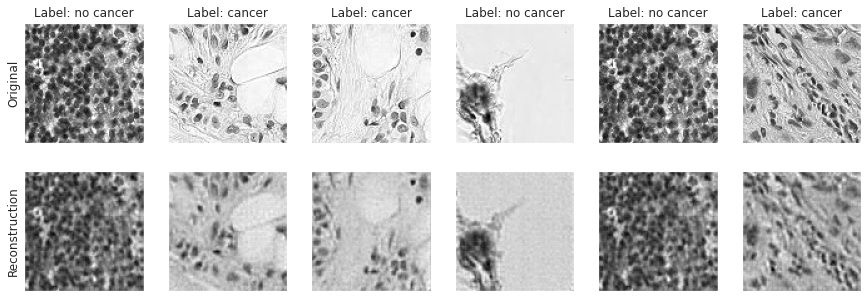

In [ ]:
visualize_random_sample(model=gcnn_ae, dataset=train_data, max_index=10)

### Badanie dla całego zbioru treningowego

W związku z tym, że zbiór treningowy zawiera 1000 obrazów w celu uzyskania dobrej jakości reprezentacji trenowano model przez 5 000 epok. Uzyskano loss=0.0316.

In [ ]:
gcnn_ae = GCNNAutoencoder(latent_dim=2)
trainer = Trainer(
    accelerator="gpu",
    max_epochs=5000, 
    logger=TensorBoardLogger(save_dir=LOG_PATH, name="gcnn_ae", default_hp_metric=False),
)

train_dl = DataLoader(train_data, batch_size = 128, shuffle = True)
test_dl = DataLoader(test_data, batch_size = 128, shuffle = True)
trainer.fit(
    model=gcnn_ae,
    train_dataloaders=train_dl,
    
)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name     | Type        | Params
-----------------------------------------
0 | _encoder | GCNNEncoder | 119 K 
1 | _decoder | CNNDecoder  | 191 K 
-----------------------------------------
310 K     Trainable params
0         Non-trainable params
310 K     Total params
1.243     Total estimated model params size (MB)


Training: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=5000` reached.


Badanie jakości reprezentacji

In [ ]:
representations = extract_representations(
    model=gcnn_ae,
    train_dl=train_dl,
    test_dl=test_dl
)

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

In [ ]:
auc_train, auc_test = evaluate_linear(
    z_train=representations["train"]["z"],
    y_train=representations["train"]["y"],
    z_test=representations["test"]["z"],
    y_test=representations["test"]["y"],
)

results = {}
results['N=8'] = {'auc_train': auc_train, 'auc_test':auc_test}

print(f"AUC => train: {auc_train * 100.0:.2f} [%], test: {auc_test * 100.0:.2f} [%]")

AUC => train: 55.21 [%], test: 61.81 [%]


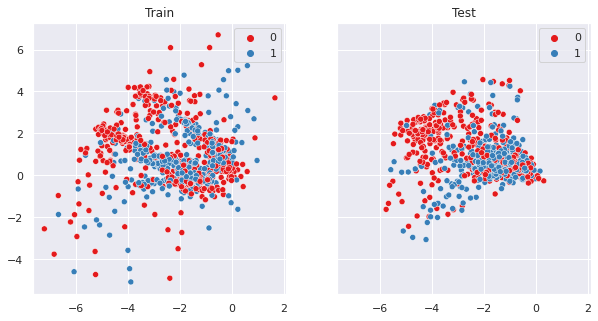

In [ ]:
visualize_latent_spaces(representations)

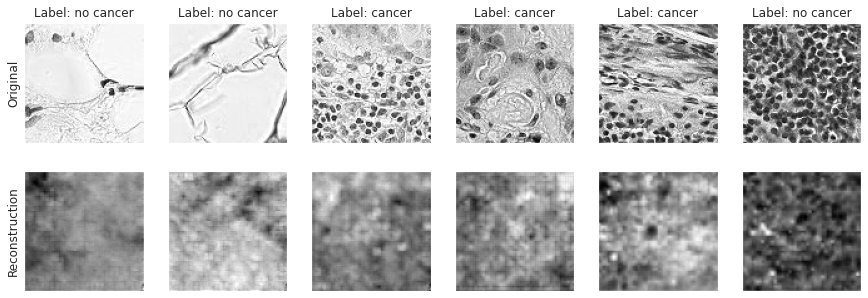

In [ ]:
visualize_random_sample(model=gcnn_ae, dataset=train_data)

Pomimo zwiększenia 2,5 krotnie liczy epok uzyskane rekonstrukcję są gorsze niż w przypadku badanego podzbioru. 

### Badanie wpływu parametru N

#### N=2

In [ ]:
class GCNNAutoencoder(Autoencoder):
    
    def __init__(self, latent_dim: int):
        super().__init__(
            encoder=GCNNEncoder(latent_dim=latent_dim, N=2),
            decoder=CNNDecoder(latent_dim=latent_dim),
        )

gcnn_ae = GCNNAutoencoder(latent_dim=2)
trainer = Trainer(
    accelerator="gpu",
    max_epochs=5000, 
    logger=TensorBoardLogger(save_dir=LOG_PATH, name="gcnn_ae", default_hp_metric=False),
)

train_dl = DataLoader(train_data, batch_size = 128, shuffle = True)
test_dl = DataLoader(test_data, batch_size = 128, shuffle = True)
trainer.fit(
    model=gcnn_ae,
    train_dataloaders=train_dl,
    
)


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name     | Type        | Params
-----------------------------------------
0 | _encoder | GCNNEncoder | 119 K 
1 | _decoder | CNNDecoder  | 191 K 
-----------------------------------------
310 K     Trainable params
0         Non-trainable params
310 K     Total params
1.243     Total estimated model params size (MB)
/usr/local/lib/python3.8/dist-packages/pytorch_lightning/trainer/trainer.py:1595: PossibleUserWarning: The number of training batches (8) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value

Training: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=5000` reached.


In [ ]:
representations = extract_representations(
    model=gcnn_ae,
    train_dl=train_dl,
    test_dl=test_dl
)

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

In [ ]:
auc_train, auc_test = evaluate_linear(
    z_train=representations["train"]["z"],
    y_train=representations["train"]["y"],
    z_test=representations["test"]["z"],
    y_test=representations["test"]["y"],
)
results['N=2'] = {'auc_train': auc_train, 'auc_test':auc_test}
print(f"AUC => train: {auc_train * 100.0:.2f} [%], test: {auc_test * 100.0:.2f} [%]")

AUC => train: 56.04 [%], test: 63.56 [%]


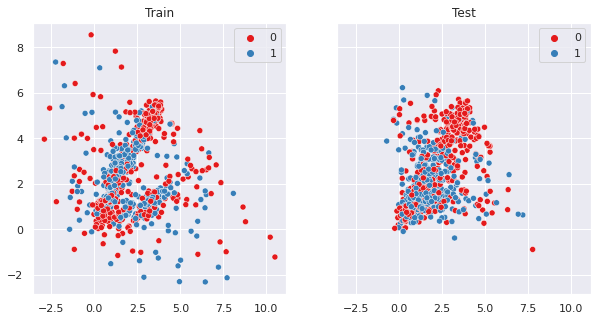

In [ ]:
visualize_latent_spaces(representations)

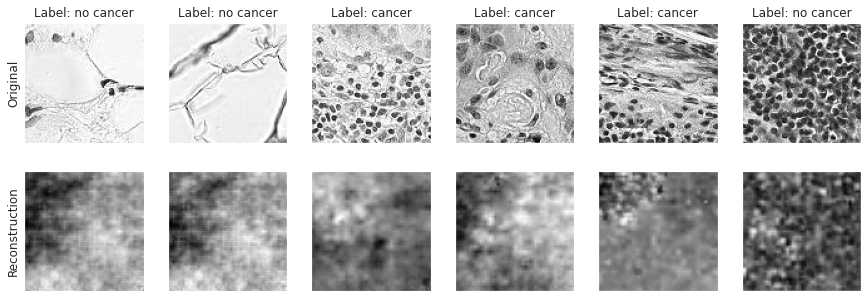

In [ ]:
visualize_random_sample(model=gcnn_ae, dataset=train_data)

#### N=4

In [ ]:
class GCNNAutoencoder(Autoencoder):
    
    def __init__(self, latent_dim: int):
        super().__init__(
            encoder=GCNNEncoder(latent_dim=latent_dim, N=4),
            decoder=CNNDecoder(latent_dim=latent_dim),
        )

gcnn_ae = GCNNAutoencoder(latent_dim=2)
trainer = Trainer(
    accelerator="gpu",
    max_epochs=5000, 
    logger=TensorBoardLogger(save_dir=LOG_PATH, name="gcnn_ae", default_hp_metric=False),
)

train_dl = DataLoader(train_data, batch_size = 128, shuffle = True)
test_dl = DataLoader(test_data, batch_size = 128, shuffle = True)
trainer.fit(
    model=gcnn_ae,
    train_dataloaders=train_dl,
    
)

/usr/local/lib/python3.8/dist-packages/e2cnn/nn/modules/r2_conv/basisexpansion_singleblock.py:80: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at ../aten/src/ATen/native/IndexingUtils.h:27.)
  full_mask[mask] = norms.to(torch.uint8)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name     | Type        | Params
-----------------------------------------
0 | _encoder | GCNNEncoder | 225 K 
1 | _decoder | CNNDecoder  | 191 K 
-----------------------------------------
416 K     Trainable params
0         Non

Training: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=5000` reached.


In [ ]:
representations = extract_representations(
    model=gcnn_ae,
    train_dl=train_dl,
    test_dl=test_dl
)

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

In [ ]:
auc_train, auc_test = evaluate_linear(
    z_train=representations["train"]["z"],
    y_train=representations["train"]["y"],
    z_test=representations["test"]["z"],
    y_test=representations["test"]["y"],
)
results['N=4'] = {'auc_train': auc_train, 'auc_test':auc_test}
print(f"AUC => train: {auc_train * 100.0:.2f} [%], test: {auc_test * 100.0:.2f} [%]")

AUC => train: 55.58 [%], test: 63.22 [%]


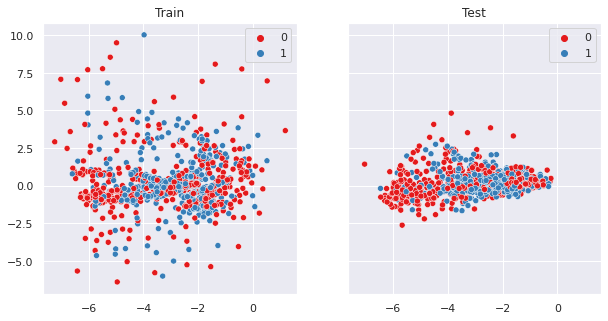

In [ ]:
visualize_latent_spaces(representations)

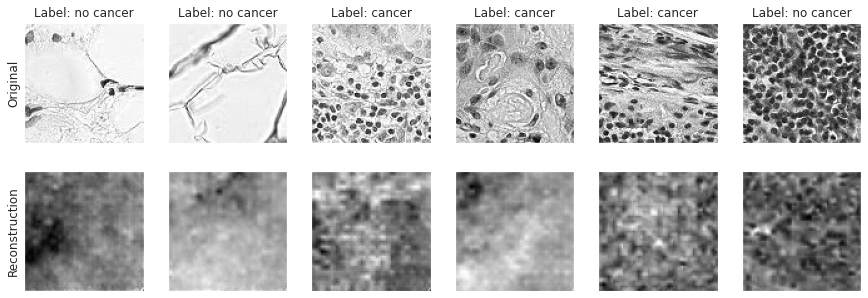

In [ ]:
visualize_random_sample(model=gcnn_ae, dataset=train_data)

#### Podsumowanie badań dotyczących wpływu parametru N

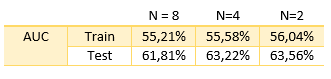

Najlepsze rezultaty uzyskano dla N=2, natomiast najgorsze dla N=8.

## Autokoder z koderem wykorzystującym sieci konwolucyjne

In [14]:
class CNNEncoder(torch.nn.Module):

    def __init__(self, latent_dim: int):
        super().__init__()

        self._layers = torch.nn.Sequential(
            # Convolution
            torch.nn.Conv2d(3, 8, 3, stride=2, padding=1),
            torch.nn.ReLU(True),
            torch.nn.Conv2d(8, 16, 3, stride=2, padding=1),
            torch.nn.ReLU(True),
            torch.nn.Conv2d(16, 32, 3, stride=2, padding=1),
            torch.nn.ReLU(True),
            torch.nn.Conv2d(32, 64, 3, stride=2, padding=1),
            torch.nn.ReLU(True),
            torch.nn.Conv2d(64, 96, 3, stride=2, padding=1),
            torch.nn.ReLU(True),
            # Invariant pooling
            torch.nn.MaxPool2d(kernel_size=3),
            # Flattening
            torch.nn.Flatten(),
            # MLP
            torch.nn.Linear(96, 128),
            torch.nn.ReLU(True),
            torch.nn.Linear(128, latent_dim),
        )

    def forward(self, img):
        return self._layers(img)


In [15]:
class CNNAutoencoder(Autoencoder):

    def __init__(self, latent_dim: int):
        super().__init__(
            encoder=CNNEncoder(latent_dim=latent_dim),
            decoder=CNNDecoder(latent_dim=latent_dim),
        )

### Badanie dla podzbioru danych

Analogicznie jak dla poprzedniego autokodera najpierw przeprowadzono badanie dla podzbioru danych. Wybrano 10 obrazów. W wyniku badania otrzymano dobrej jakości rekonstrukcje.

In [16]:
conv_ae = CNNAutoencoder(latent_dim=2)
trainer = Trainer(
    max_epochs=5000, 
    logger=TensorBoardLogger(save_dir=LOG_PATH, name="conv_ae", default_hp_metric=False),
)

train_dl = DataLoader(train_data[:10], batch_size = 64, shuffle = True)
test_dl = DataLoader(test_data, batch_size = 128, shuffle = True)

trainer.fit(
    model=conv_ae,
    train_dataloaders=train_dl,
)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.8/dist-packages/pytorch_lightning/trainer/setup.py:175: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
  rank_zero_warn(
INFO:pytorch_lightning.callbacks.model_summary:
  | Name     | Type       | Params
----------------------------------------
0 | _encoder | CNNEncoder | 92.6 K
1 | _decoder | CNNDecoder | 191 K 
----------------------------------------
284 K     Trainable params
0         Non-trainable params
284 K     Total params
1.137     Total estimated model params size (MB)
/usr/local/lib/python3.8/dist-packages/pytorch_lightning/trainer/trainer.py:1595: Pos

Training: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=5000` reached.


In [17]:
representations = extract_representations(
    model=conv_ae,
    train_dl=train_dl,
    test_dl=test_dl
)

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

In [18]:
auc_train, auc_test = evaluate_linear(
    z_train=representations["train"]["z"],
    y_train=representations["train"]["y"],
    z_test=representations["test"]["z"],
    y_test=representations["test"]["y"],
)

print(f"AUC => train: {auc_train * 100.0:.2f} [%], test: {auc_test * 100.0:.2f} [%]")

AUC => train: 91.67 [%], test: 35.30 [%]


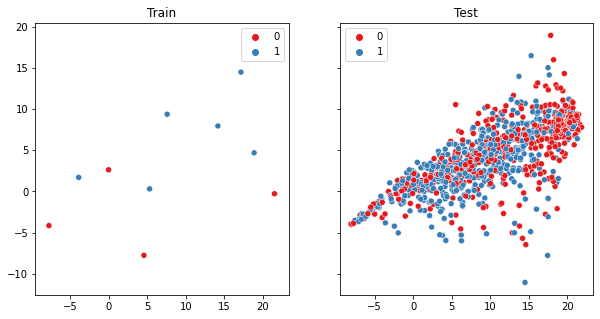

In [19]:
visualize_latent_spaces(representations)

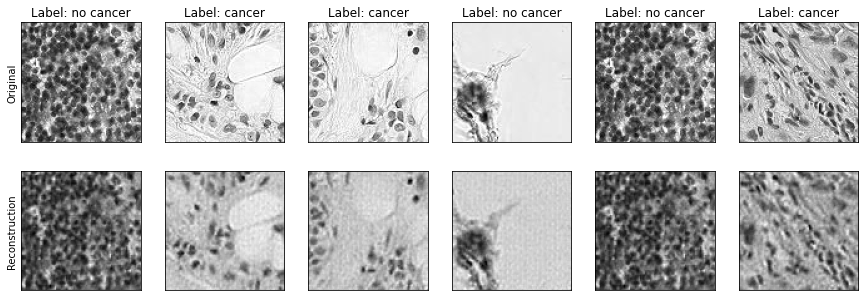

In [20]:
visualize_random_sample(model=conv_ae, dataset=train_data, max_index=10)

### Badanie dla całego zbioru danych

In [22]:
conv_ae = CNNAutoencoder(latent_dim=2)
trainer = Trainer(
    max_epochs=5000, 
    logger=TensorBoardLogger(save_dir=LOG_PATH, name="conv_ae", default_hp_metric=False),
)

train_dl = DataLoader(train_data, batch_size = 128, shuffle = True)
test_dl = DataLoader(test_data, batch_size = 128, shuffle = True)

trainer.fit(
    model=conv_ae,
    train_dataloaders=train_dl,
)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.8/dist-packages/pytorch_lightning/trainer/setup.py:175: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
  rank_zero_warn(
INFO:pytorch_lightning.callbacks.model_summary:
  | Name     | Type       | Params
----------------------------------------
0 | _encoder | CNNEncoder | 92.6 K
1 | _decoder | CNNDecoder | 191 K 
----------------------------------------
284 K     Trainable params
0         Non-trainable params
284 K     Total params
1.137     Total estimated model params size (MB)
/usr/local/lib/python3.8/dist-packages/pytorch_lightning/trainer/trainer.py:1595: Pos

Training: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=5000` reached.


In [23]:
representations = extract_representations(
    model=conv_ae,
    train_dl=train_dl,
    test_dl=test_dl
)

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

In [24]:
auc_train, auc_test = evaluate_linear(
    z_train=representations["train"]["z"],
    y_train=representations["train"]["y"],
    z_test=representations["test"]["z"],
    y_test=representations["test"]["y"],
)

print(f"AUC => train: {auc_train * 100.0:.2f} [%], test: {auc_test * 100.0:.2f} [%]")

AUC => train: 55.30 [%], test: 64.17 [%]


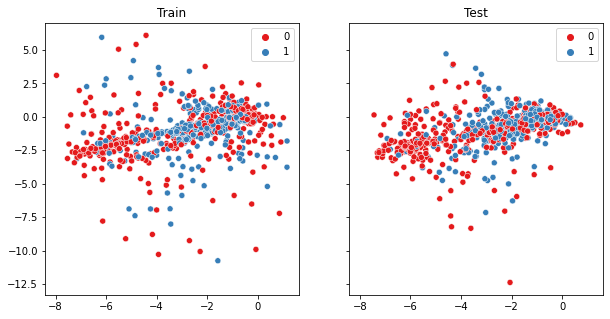

In [25]:
visualize_latent_spaces(representations)

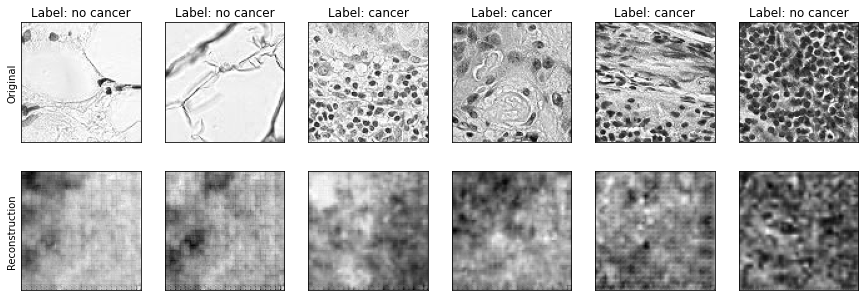

In [26]:
visualize_random_sample(model=conv_ae, dataset=train_data)

### Podsumowanie

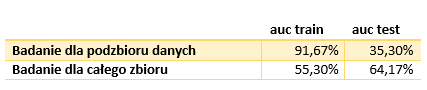

Przeprowadzenie uczenia na całym zbiorze pozwala na osiągnięcie lepszych wyników. Przy czym uzyskane wyniki dla całego zbioru są porównywalne z wynikami autokodera wykorzystującego ekwiwariantne sieci konwolucyjne.

## wygenerowanie requirements.txt

In [30]:
!pip freeze > requirements.txt